# import libraries

In [1]:
import os
import glob
import yaml
from ultralytics import YOLO
import matplotlib.pyplot as plt

# create yaml file to train

In [ ]:
def create_data_yaml(path_to_classes_txt, path_to_data_yaml):

  # Read class.txt to get class names
  if not os.path.exists(path_to_classes_txt):
    print(f'classes.txt file not found! Please create a classes.txt\
          labelmap and move it to {path_to_classes_txt}')
    return
  with open(path_to_classes_txt, 'r') as f:
    classes = []
    for line in f.readlines():
      if len(line.strip()) == 0: continue
      classes.append(line.strip())
  number_of_classes = len(classes)

  # Create data dictionary
  data = {
      'path': 'data',
      'train': 'images/train',
      'val': 'images/val',
      'nc': number_of_classes,
      'names': classes
  }

  # Write data to YAML file
  with open(path_to_data_yaml, 'w') as f:
    yaml.dump(data, f, sort_keys=False)
  print(f'Created config file at {path_to_data_yaml}')

  return

# Define path to classes.txt and run function
path_to_classes_txt = 'data/classes.txt'
path_to_data_yaml = 'data.yaml'

create_data_yaml(path_to_classes_txt, path_to_data_yaml)

Created config file at data.yaml


# train model

In [ ]:
!yolo detect train \
  data="data.yaml" \
  model=yolo11n.pt \
  epochs=200 \
  imgsz=640 \
  batch=8 \
  lr0=0.005 \
  optimizer=AdamW \
  weight_decay=0.01

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.113 🚀 Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/drive/My Drive/cow-detection/data.yaml, epochs=200, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_

# predict val

In [3]:
!yolo detect predict model="runs/detect/train/weights/best.pt" source=data/images/val save=True

Creating new Ultralytics Settings v0.0.6 file  
View Ultralytics Settings with 'yolo settings' or at 'C:\Users\ADMIN\AppData\Roaming\Ultralytics\settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.112  Python-3.9.0 torch-1.13.0+cu116 CUDA:0 (NVIDIA GeForce GTX 1650 with Max-Q Design, 4096MiB)
YOLO11n summary (fused): 100 layers, 2,582,347 parameters, 0 gradients, 6.3 GFLOPs

image 1/11 c:\Users\ADMIN\University_3\U3_2\ng dung ttnt trong nng nghip\final_project\file_work\data\images\val\72.png: 448x640 31 cows, 42.1ms
image 2/11 c:\Users\ADMIN\University_3\U3_2\ng dung ttnt trong nng nghip\final_project\file_work\data\images\val\76.png: 384x640 24 cows, 43.1ms
image 3/11 c:\Users\ADMIN\University_3\U3_2\ng dung ttnt trong nng nghip\final_project\file_work\data\images\val\77.png: 480x640 14 cows, 29.3ms
image 4/11 c:\Users\ADMIN\University_3\U3

Error processing line 1 of C:\Users\ADMIN\AppData\Local\Programs\Python\Python39\lib\site-packages\vision-1.0.0-py3.9-nspkg.pth:

  Traceback (most recent call last):
    File "C:\Users\ADMIN\AppData\Local\Programs\Python\Python39\lib\site.py", line 169, in addpackage
      exec(line)
    File "<string>", line 1, in <module>
    File "<frozen importlib._bootstrap>", line 562, in module_from_spec
  AttributeError: 'NoneType' object has no attribute 'loader'

Remainder of file ignored


## visualize

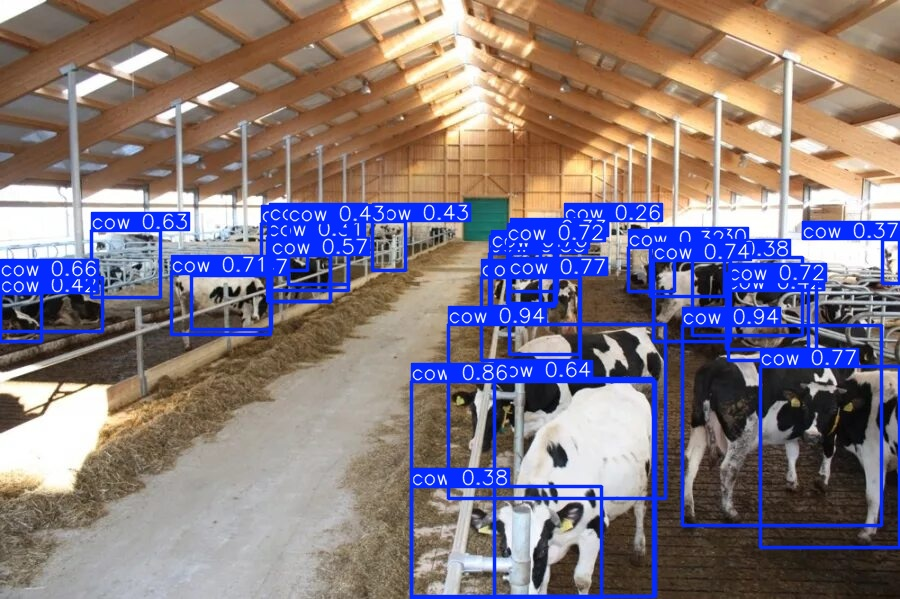

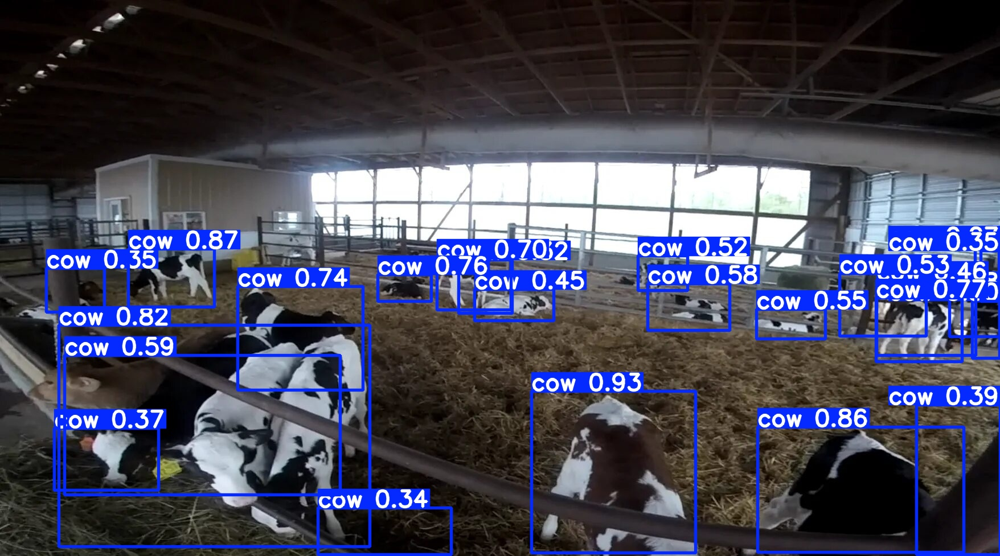

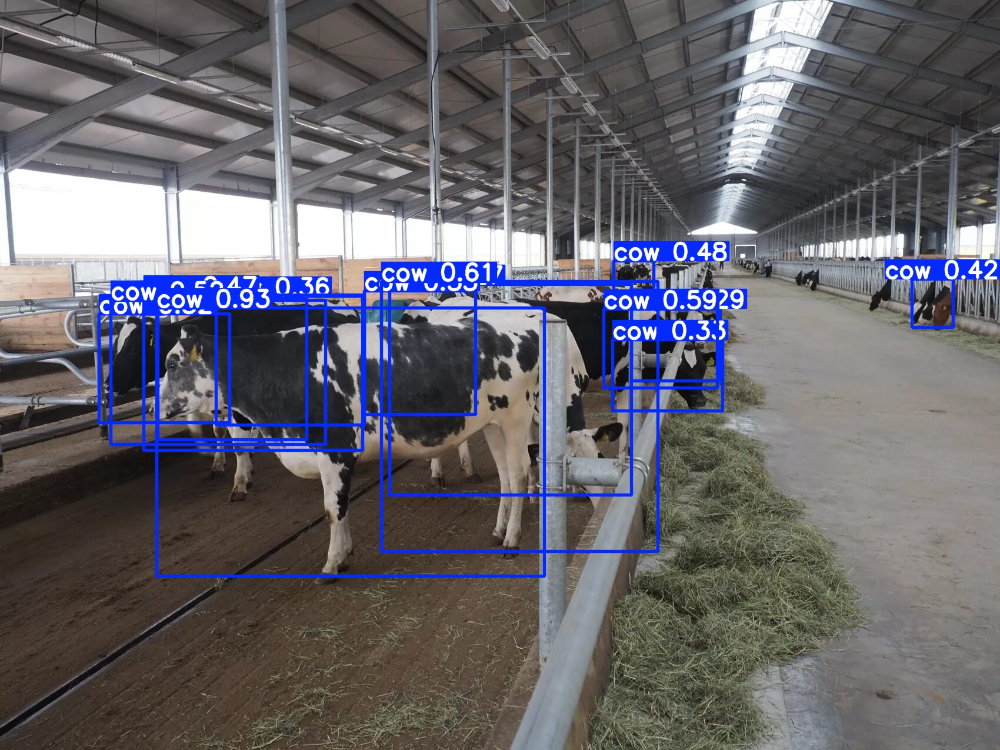

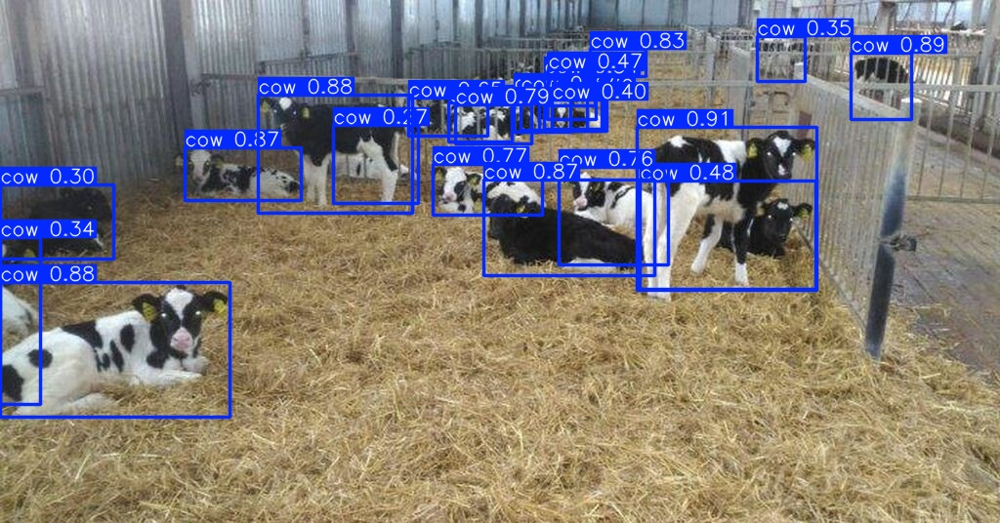

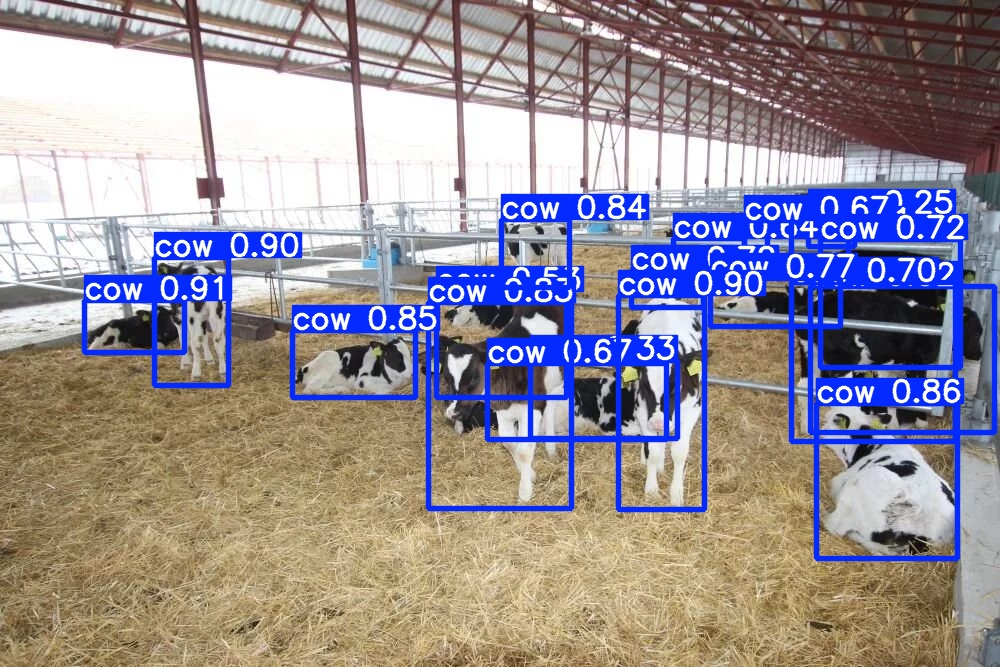

...

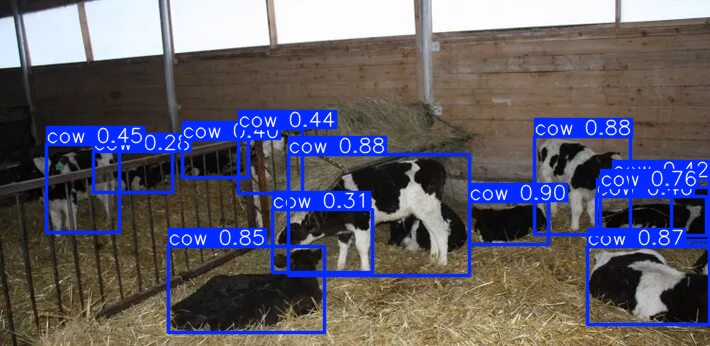

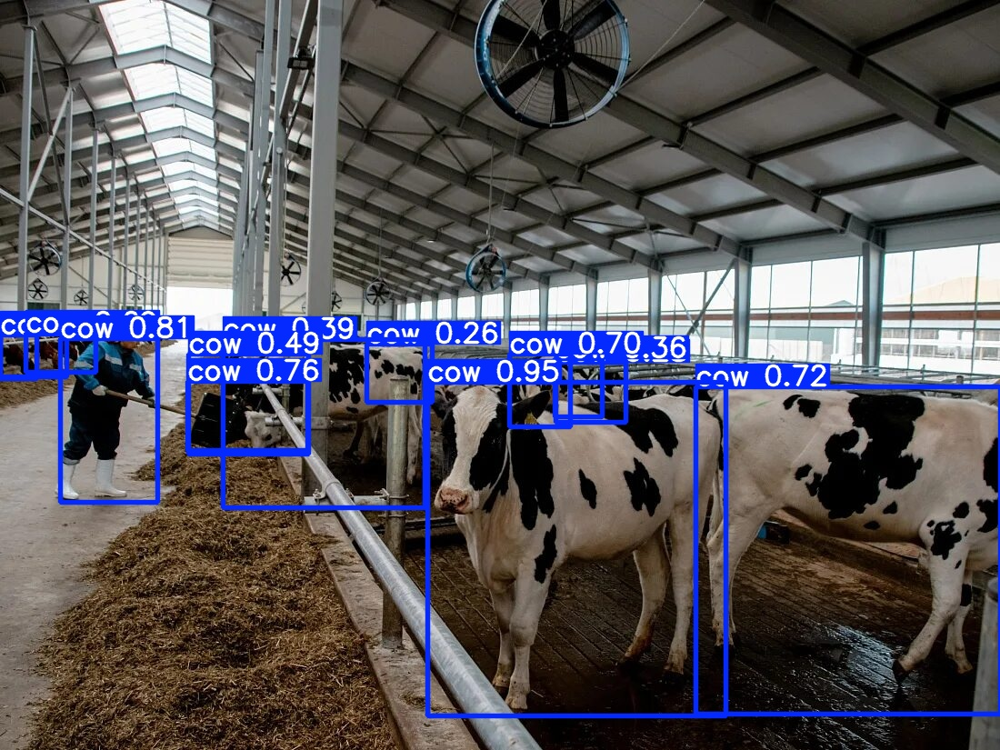

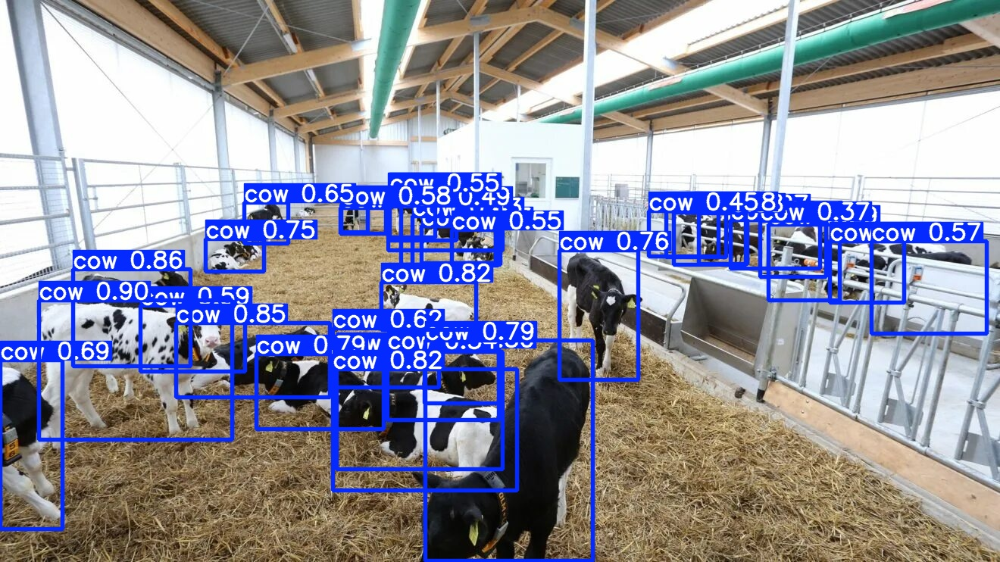

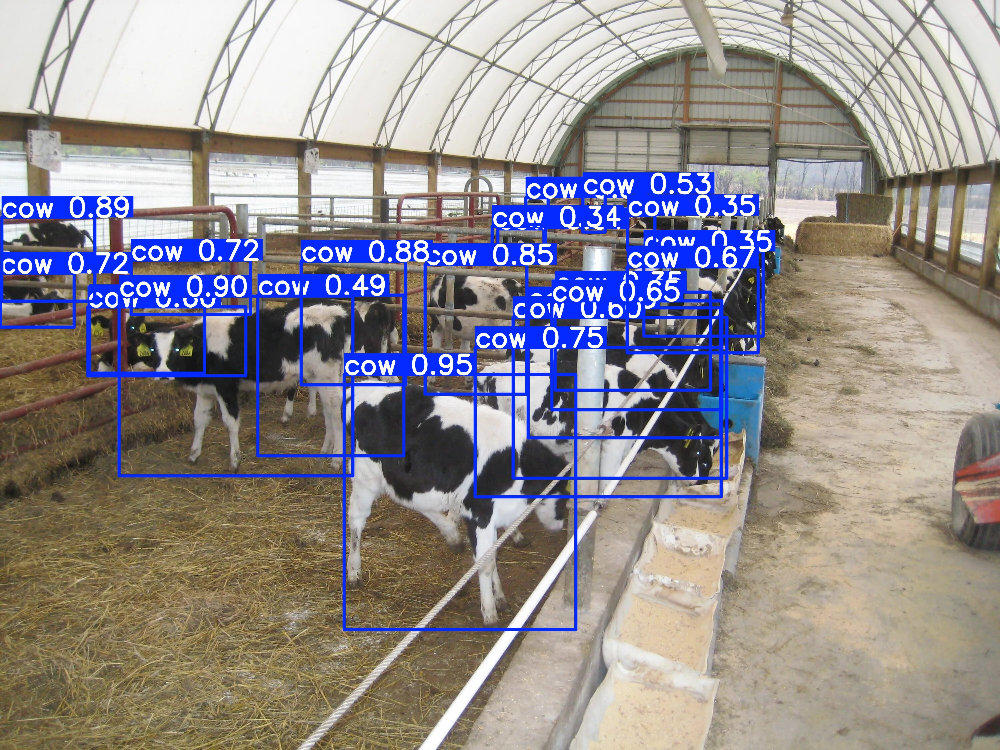

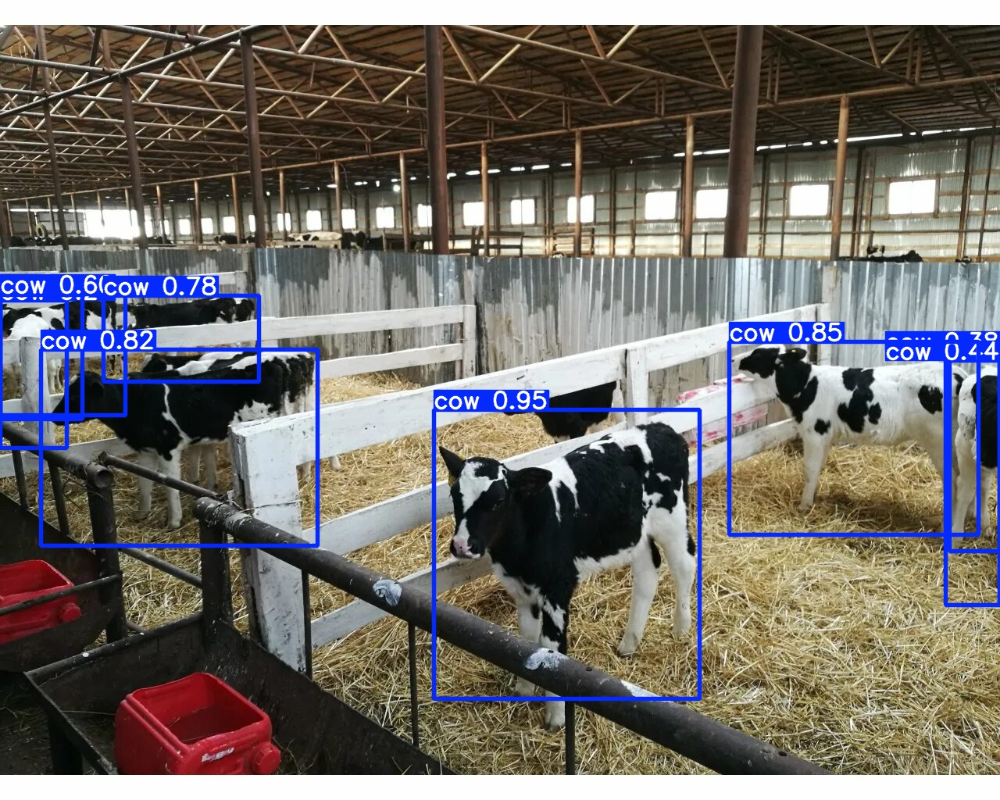

In [ ]:
from IPython.display import Image, display
for image_path in glob.glob(f'runs/detect/predict/*.jpg'): # first 10 sample
  display(Image(filename=image_path, width=500, height=500))
  print('\n')

# count

In [2]:
model = YOLO("runs/detect/train/weights/best.pt")


image 1/1 c:\Users\ADMIN\University_3\U3_2\ng dung ttnt trong nng nghip\final_project\file_work\data\images\val\72.png: 448x640 31 cows, 25.2ms
Speed: 32.7ms preprocess, 25.2ms inference, 81.8ms postprocess per image at shape (1, 3, 448, 640)
(599, 900, 3)
Number of cows: 31

image 1/1 c:\Users\ADMIN\University_3\U3_2\ng dung ttnt trong nng nghip\final_project\file_work\data\images\val\76.png: 384x640 24 cows, 30.3ms
Speed: 2.3ms preprocess, 30.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
(977, 1756, 3)
Number of cows: 24

image 1/1 c:\Users\ADMIN\University_3\U3_2\ng dung ttnt trong nng nghip\final_project\file_work\data\images\val\77.png: 480x640 14 cows, 20.8ms
Speed: 3.4ms preprocess, 20.8ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)
(1275, 1700, 3)
Number of cows: 14

image 1/1 c:\Users\ADMIN\University_3\U3_2\ng dung ttnt trong nng nghip\final_project\file_work\data\images\val\78.png: 352x640 24 cows, 22.6ms
Speed: 1.9ms preprocess, 

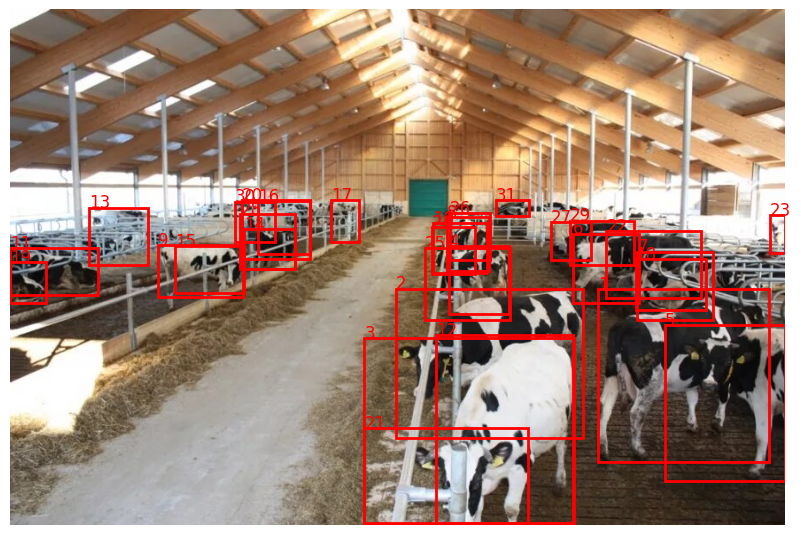

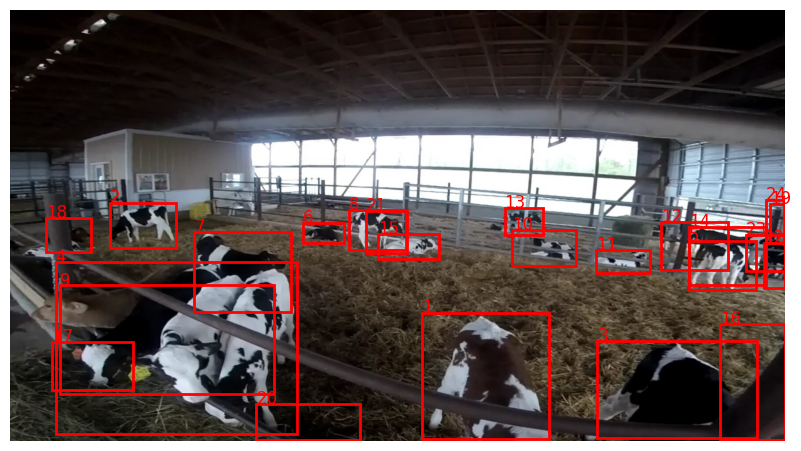

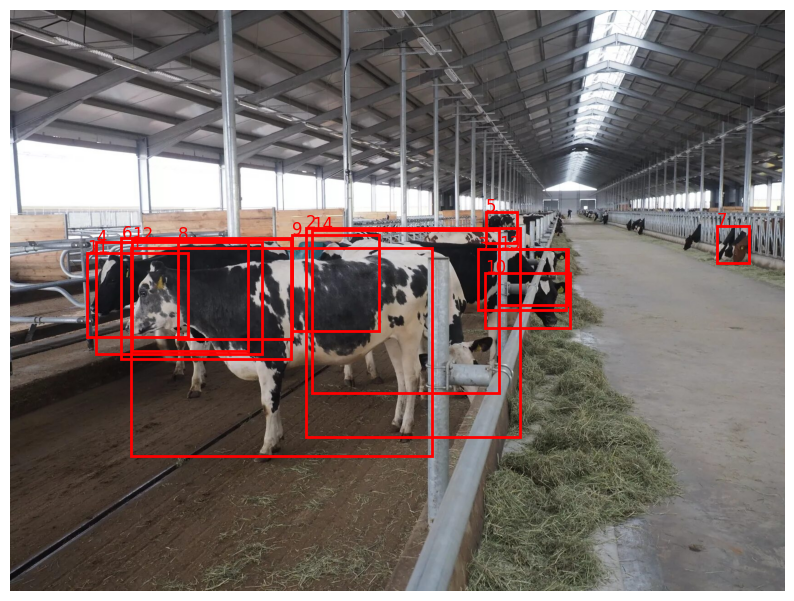

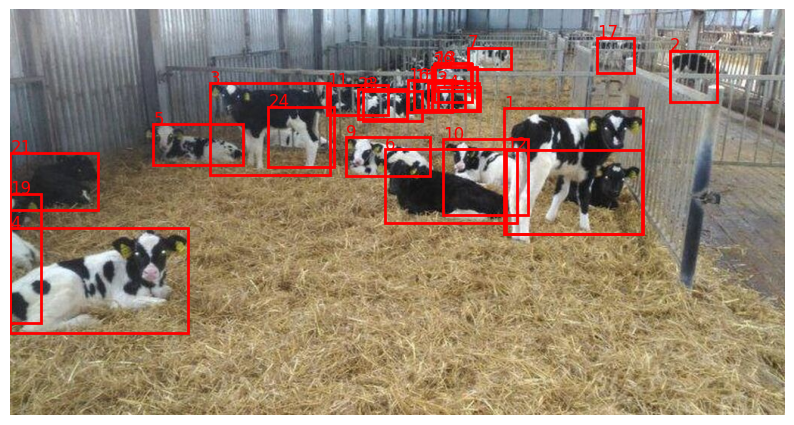

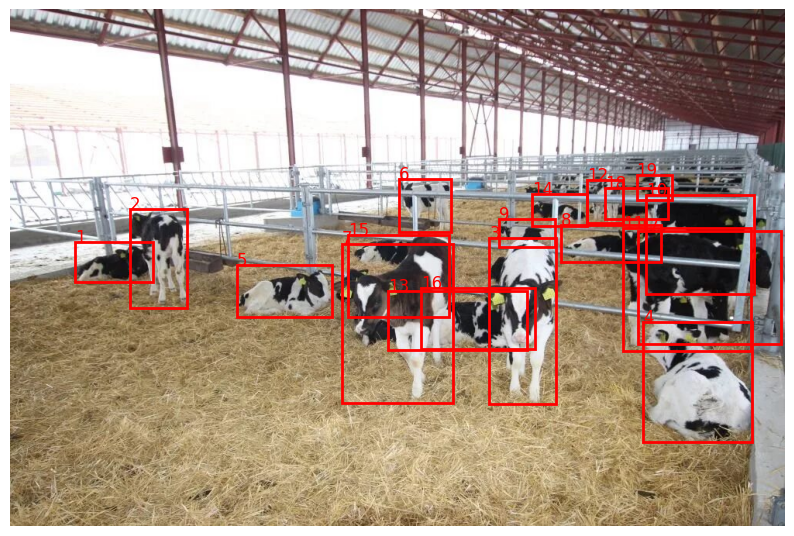

...

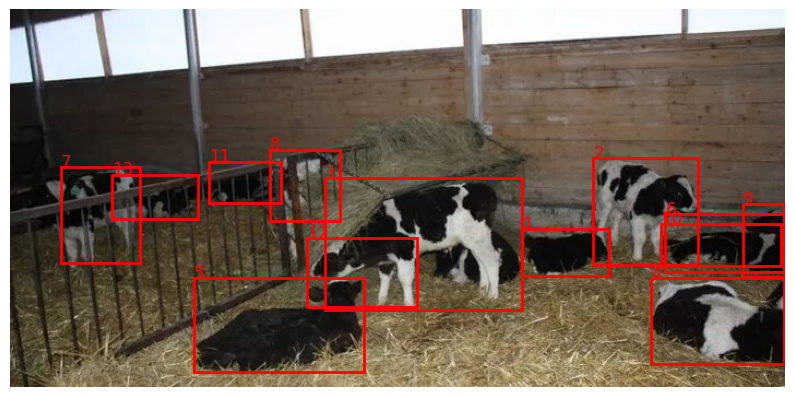

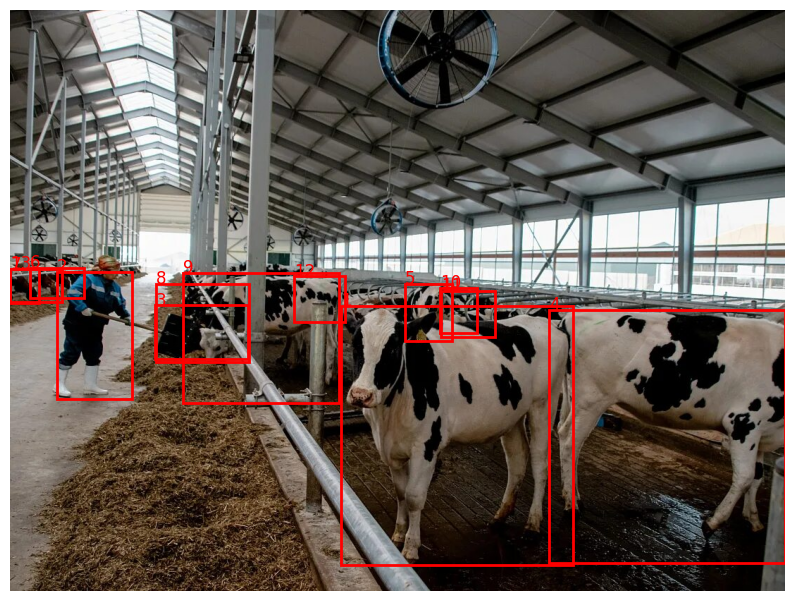

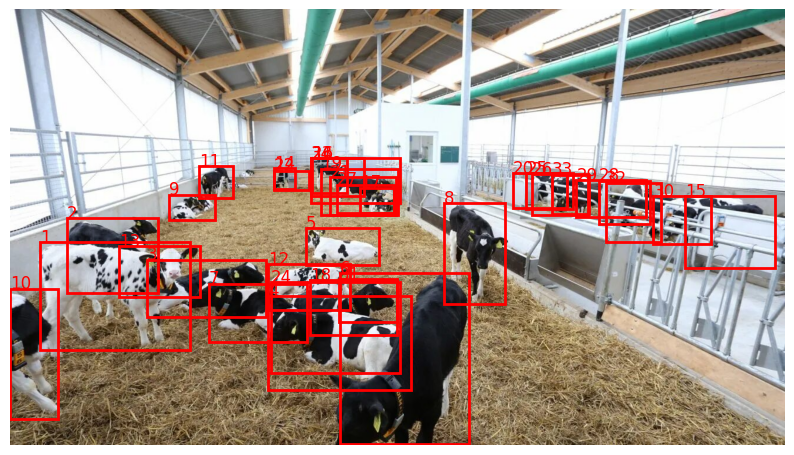

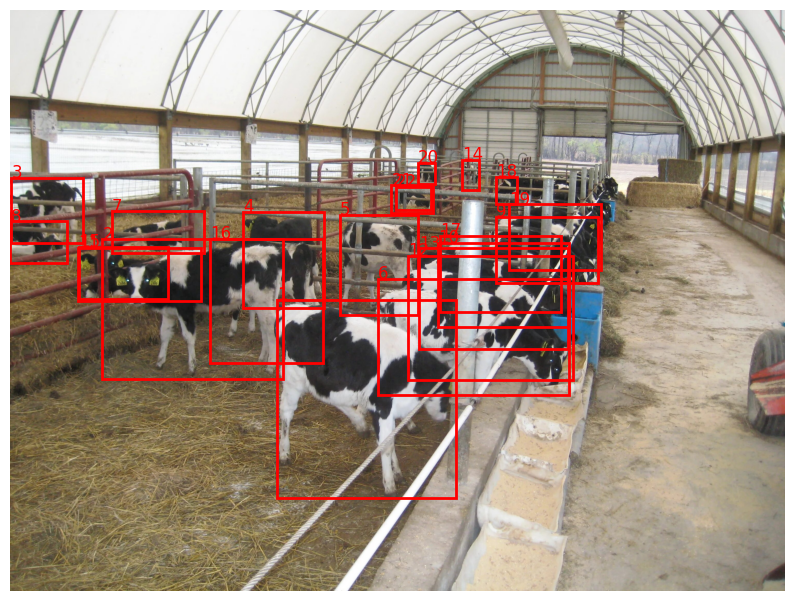

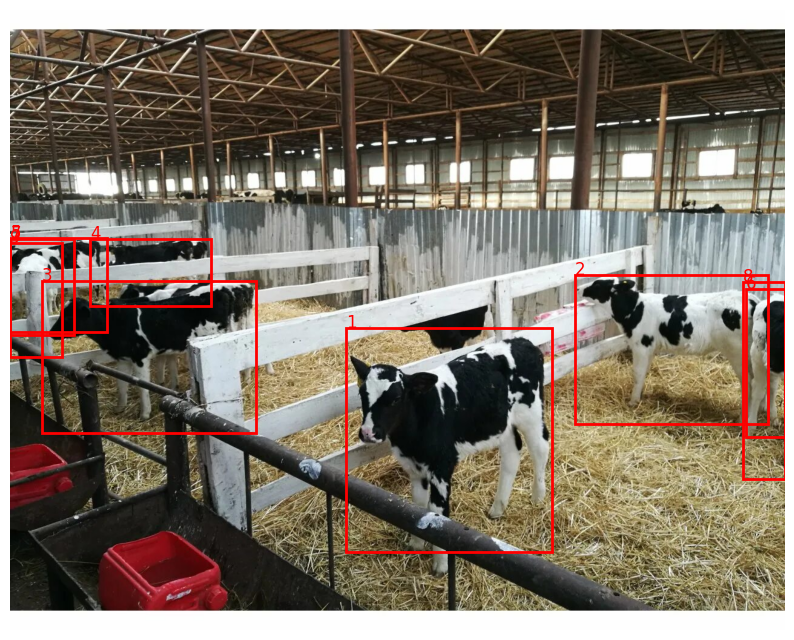

In [3]:
for path in glob.glob(f'data/images/val/*.png'):
  example_image = (path)
  results = model(example_image)
  bboxes = results[0].boxes.xyxy
  img = results[0].orig_img
  fig, ax = plt.subplots(1, 1, figsize=(10, 10))
  print(img.shape)
  # convert BGR2RGB
  img = img[:, :, ::-1]
  ax.imshow(img)
  # draw rectangle box
  count = 0
  for i in range(len(bboxes)):
    x1, y1, x2, y2 = bboxes[i]
    x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
    rect = plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False,
                         edgecolor='red', linewidth=2)
    ax.add_patch(rect)
    plt.text(x1, y1, f'{i + 1}', color='red', fontsize=12)
    count += 1
  print(f"Number of cows: {count}")
  ax.axis("off")